In [1]:
import pandas as pd
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import matplotlib.patheffects as PathEffects
from PIL import Image, ImageDraw, ImageOps
%matplotlib inline
import seaborn as sns
import random
import os
import gc
from sklearn.manifold import TSNE
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras import models, Sequential
from tensorflow.keras import optimizers
from tensorflow.keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPooling2D, SeparableConv2D
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.preprocessing.image import ImageDataGenerator, img_to_array, load_img
from keras.preprocessing.image import img_to_array, load_img
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.metrics import roc_curve, auc
from sklearn.metrics import precision_recall_curve

In [2]:
train_dir = r"C:/Users/yalal/Downloads/autisum spectrum/train"
test_dir = r"C:/Users/yalal/Downloads/autisum spectrum/test"

In [3]:
import os
import random
import gc
train_non_autistic = []
train_autistic = []
train_dir = r"C:/Users/yalal/Downloads/autisum spectrum/train"
test_dir = r"C:/Users/yalal/Downloads/autisum spectrum/test"
for i in os.listdir(train_dir):
    file_path = os.path.join(train_dir, i)
    if 'Non_Autistic' in i:
        train_non_autistic.append(file_path)
    else:
        train_autistic.append(file_path)
test_imgs = [os.path.join(test_dir, i) for i in os.listdir(test_dir)]
train_imgs = train_autistic + train_non_autistic
random.shuffle(train_imgs)
del train_autistic
del train_non_autistic
gc.collect()

12

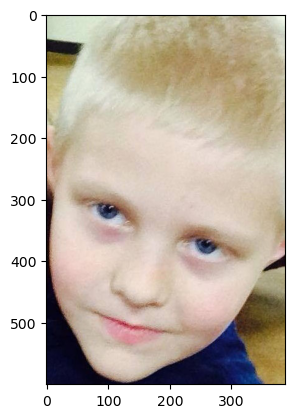

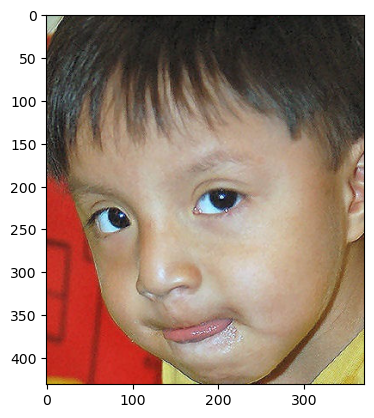

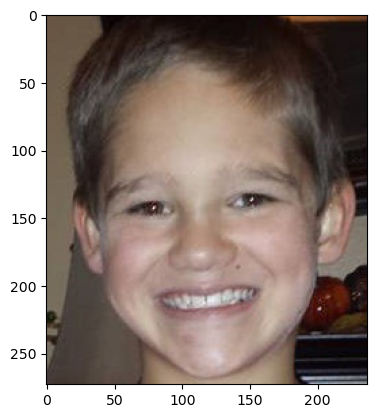

In [4]:
# Plot first 3 images from train_imgs
import matplotlib.image as mpimg
for ima in train_imgs[0:3]:
    img=mpimg.imread(ima)
    imgplot = plt.imshow(img)
    plt.show()

In [5]:
nrows = 150
ncolumns  = 150
channels = 3
def read_and_process_image(list_of_images):
    X = []
    y = []
    for image in list_of_images:
        X.append(cv2.resize(cv2.imread(image, cv2.IMREAD_COLOR), (nrows, ncolumns), interpolation = cv2.INTER_CUBIC))
        if 'Non_Autistic' in image:
            y.append(0)
        else:
            y.append(1)        
    return X,y 

In [6]:
X_train, y_train = read_and_process_image(train_imgs)

In [7]:
sns.set_palette(sns.color_palette(["b", "r"]))
plt.figure(figsize=(12, 8))
X_train = np.array(X_train)
y_train = np.array(y_train)

<Figure size 1200x800 with 0 Axes>

In [8]:
def process_data_tsne(list_of_images):
    nrows = 150
    ncolumns  = 150
    channels = 3
    X = []
    y = []
    for image in list_of_images:
        X.append(cv2.resize(cv2.imread(image, cv2.COLOR_BGR2GRAY), (nrows, ncolumns)))
        if 'Non_Autistic' in image:
            y.append(0)
        else:
            y.append(1)     
    X = np.asarray(X)
    y = np.asarray(y)
    X = X.reshape(2540, 150*150*3)
    return X,y

In [9]:
features, labels = process_data_tsne(train_imgs)

In [10]:
tsne = TSNE(random_state=42).fit_transform(features)

In [11]:
def visualise_tsne_3d(tsne_data, target):
    colour_map = []
    for i in target:
        if i == 1:
            colour_map.append('r')
        else:
            colour_map.append('b')
    fig = plt.figure(figsize=(18, 18))
    ax = fig.add_subplot(111, projection='3d')
    ax.scatter(*zip(*tsne), c=colour_map, s=30, alpha=1)
    legenditems = [(plt.Rectangle((0,0),1,1, color=c), "Non_Autistic" if str(i) == '0' else "Autistic") for i,c in enumerate(np.unique(colour_map))]
    plt.legend(*zip(*legenditems))
    plt.show()

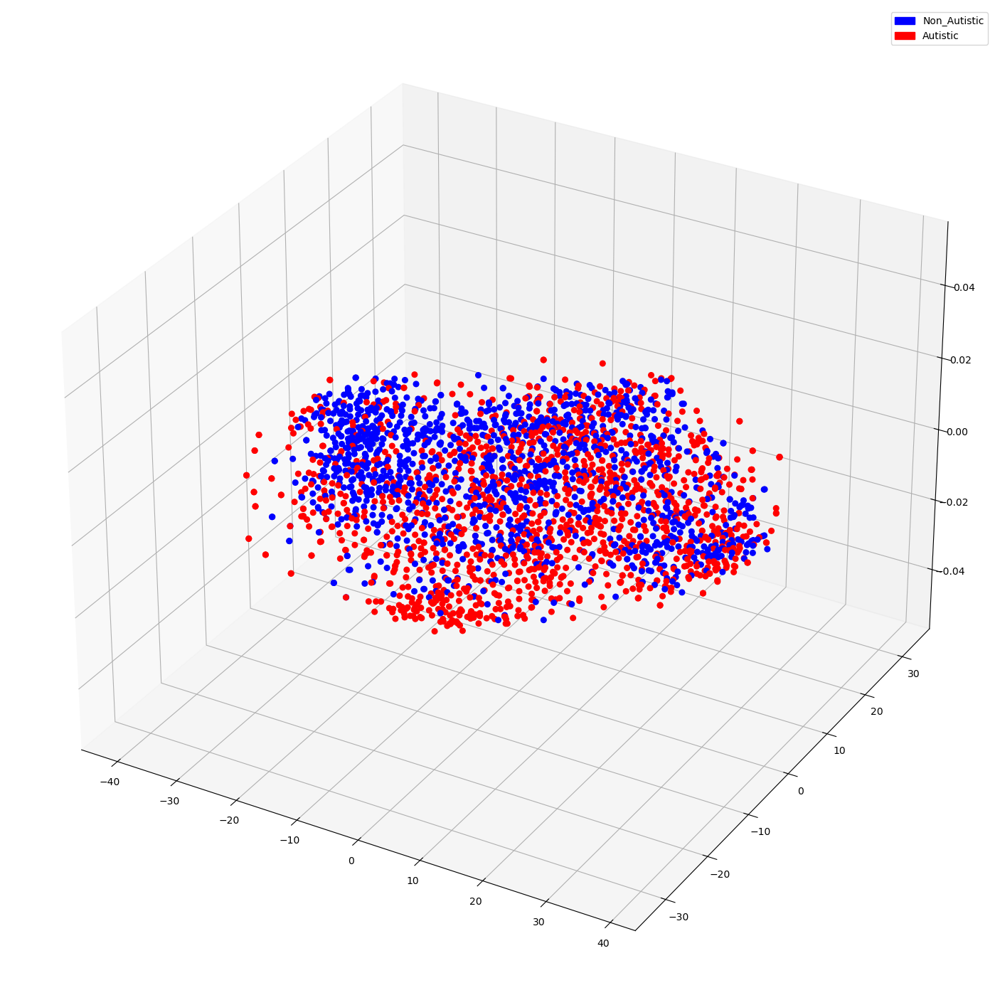

In [12]:
visualise_tsne_3d(tsne, labels)

In [13]:
def visualise_tsne_datapoints(tsne_data, labels):
    
    """Takes in tsne projections, plots distribution of datapoints in 2 classes"""
    
    tx = tsne_data[:,0]
    ty = tsne_data[:,1]
    plt.figure(figsize=(20,18))
    sns.scatterplot(
    x=tx, y=ty,
    hue=labels,
    palette=['blue', 'red'],
    s=300, 
    legend='auto'
    )

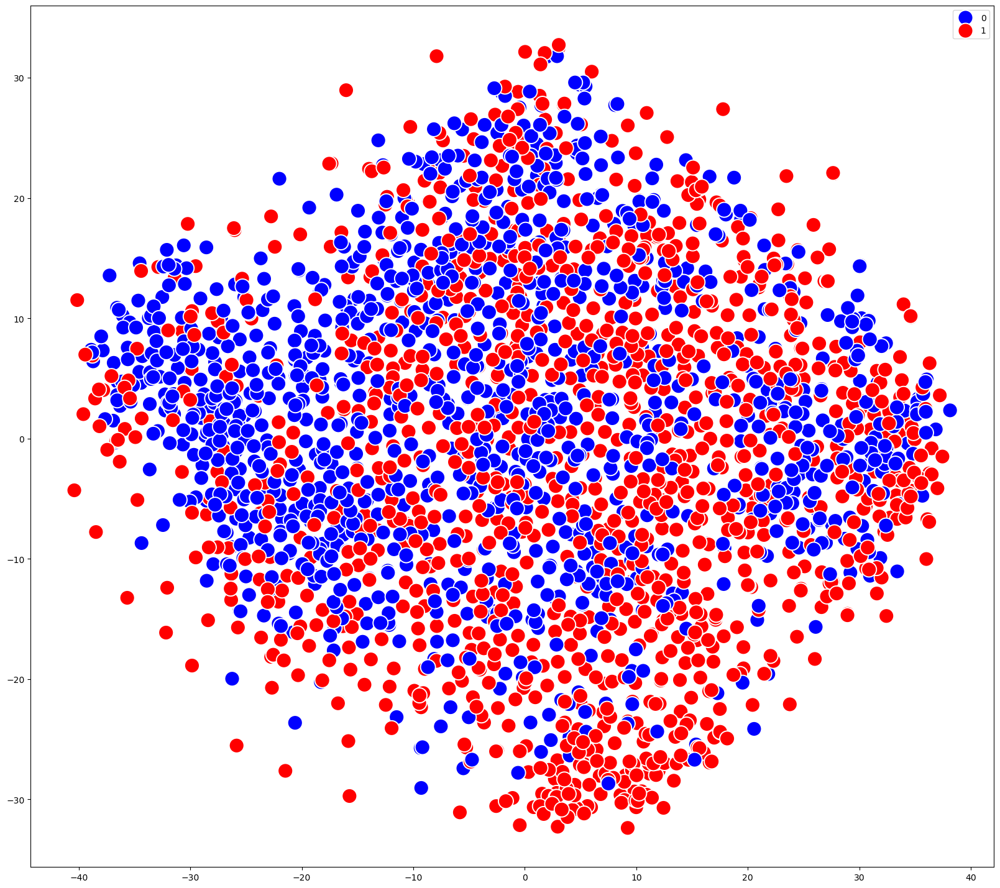

In [14]:
visualise_tsne_datapoints(tsne,labels)

In [15]:
import numpy as np
import os
from PIL import Image, ImageDraw
import matplotlib.pyplot as plt
def visualise_tsne_images(tsne_data, train_images, labels):
    tx = tsne_data[:, 0]
    ty = tsne_data[:, 1]
    image_paths = [train_images[i] for i in range(len(train_images))]
    tx = (tx - np.min(tx)) / (np.max(tx) - np.min(tx))
    ty = (ty - np.min(ty)) / (np.max(ty) - np.min(ty))
    width = 4000
    height = 3000
    max_dim = 200
    full_image = Image.new('RGBA', (width, height))
    for img, x, y, label in zip(image_paths, tx, ty, labels):
        tile = Image.open(img)
        rs = max(1, tile.width / max_dim, tile.height / max_dim)
        tile = tile.resize((int(tile.width / rs), int(tile.height / rs)), Image.Resampling.LANCZOS)
        tile_height, tile_width = tile.size
        draw = ImageDraw.Draw(tile)
        draw.rectangle((0, 0, tile_height-1, tile_width-1), fill=None, outline='blue' if label == 0 else 'red', width=8)
        full_image.paste(tile, (int((width - max_dim) * x), int((height - max_dim) * (1 - y))), mask=tile.convert('RGBA'))
    plt.figure(figsize=(30, 28))
    plt.imshow(full_image)
    plt.show()

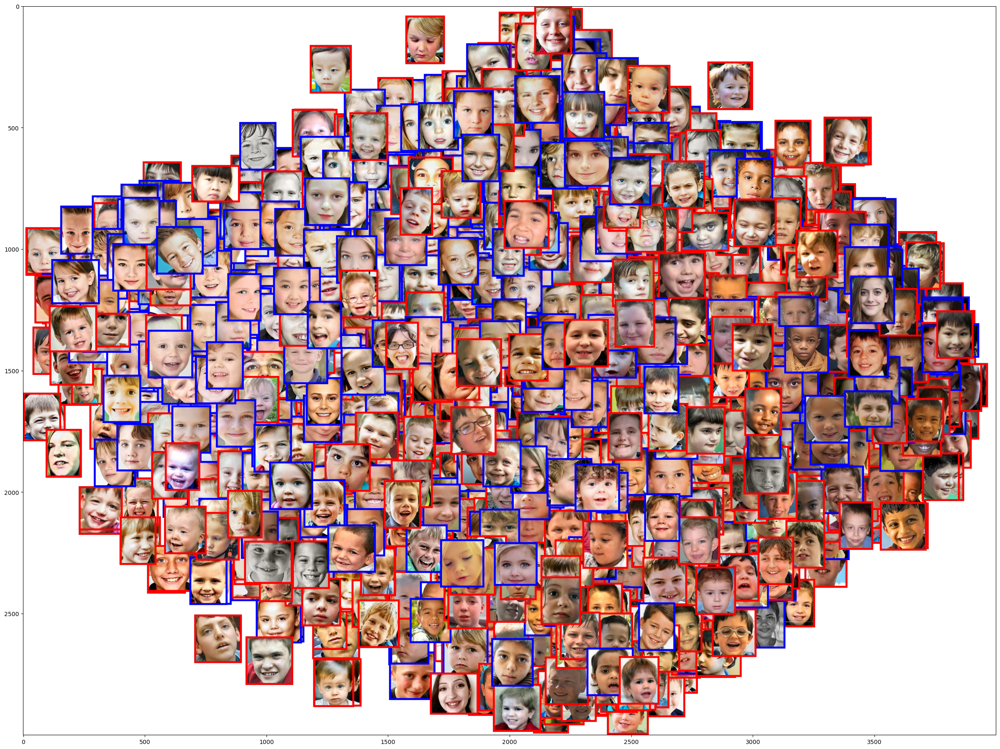

In [16]:
visualise_tsne_images(tsne, train_imgs, labels)

In [17]:
print("Shape of train images:", X_train.shape)
print("Shape of train labels:", y_train.shape)

Shape of train images: (2540, 150, 150, 3)
Shape of train labels: (2540,)


In [18]:
val_autistic_path =  r"C:\Users\yalal\Downloads\autisum spectrum\valid\Autistic"
val_non_autistic_path =  r"C:\Users\yalal\Downloads\autisum spectrum\valid\Non_Autistic"

val_autistic_imgs = [os.path.join(val_autistic_path, i) for i in os.listdir(val_autistic_path)]
val_non_autistic_imgs = [os.path.join(val_non_autistic_path, i) for i in os.listdir(val_non_autistic_path)]
val_imgs = val_autistic_imgs + val_non_autistic_imgs
random.shuffle(val_imgs)
del val_autistic_imgs
del val_non_autistic_imgs
gc.collect()
X_val, y_val = read_and_process_image(val_imgs)

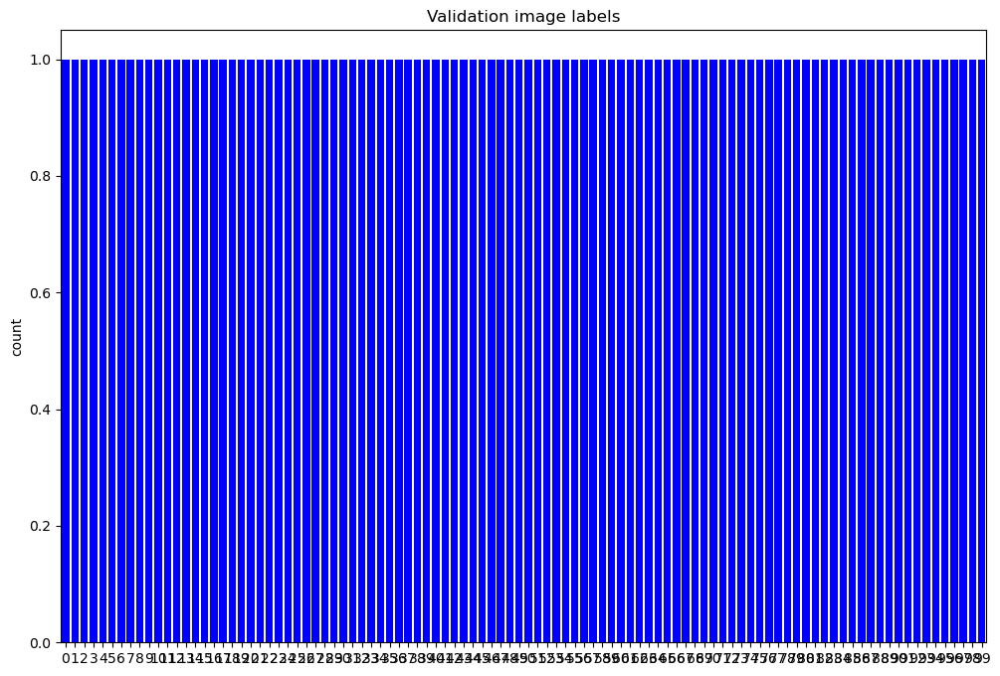

In [19]:
X_val = np.array(X_val)
y_val = np.array(y_val)
sns.set_palette(sns.color_palette(["b", "r"]))
plt.figure(figsize=(12, 8))
sns.countplot(y_val, saturation=1)
plt.title("Validation image labels")
plt.show()

In [20]:
print("Shape of validation images:", X_val.shape)
print("Shape of validation labels:", y_val.shape)

Shape of validation images: (100, 150, 150, 3)
Shape of validation labels: (100,)


In [21]:
ntrain = len(X_train)
nval = len(X_val)
BATCH_SIZE = 32

In [22]:
base_model = VGG16(include_top=False,weights='imagenet',input_shape=(150,150,3))

In [23]:
for layer in base_model.layers:
   layer.trainable = False

In [24]:
print("Number of layers in the base model: ", len(base_model.layers))

Number of layers in the base model:  19


In [25]:
model = keras.models.Sequential()
model.add(base_model)
model.add(layers.Flatten())
model.add(layers.Dense(512, activation = 'relu'))
model.add(layers.Dropout(0.5))
model.add(layers.Dense(1, activation = 'sigmoid'))

In [28]:
model.compile(loss = 'binary_crossentropy', optimizer = keras.optimizers.Adam(), metrics = ['acc'])

In [29]:
train_datagen = ImageDataGenerator(rescale = 1./255,
                                  rotation_range = 40,
                                  width_shift_range = 0.2,
                                  height_shift_range = 0.2,
                                  shear_range = 0.2,
                                  zoom_range = 0.2,
                                  horizontal_flip = True)
                        
val_datagen = ImageDataGenerator(rescale = 1./255)

In [30]:
train_generator = train_datagen.flow(X_train, y_train, batch_size = BATCH_SIZE)
val_generator = val_datagen.flow(X_val, y_val, batch_size = BATCH_SIZE)

In [31]:
early_stopping = keras.callbacks.EarlyStopping(monitor="val_loss", patience=3)

history = model.fit(train_generator,
                              epochs=30,
                              validation_data=val_generator,
                              callbacks=[early_stopping]
                             )

Epoch 1/30


C:\Users\yalal\anaconda3\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


80/80 ━━━━━━━━━━━━━━━━━━━━ 129s 2s/step - acc: 0.5977 - loss: 1.0241 - val_acc: 0.7400 - val_loss: 0.5374
Epoch 2/30
80/80 ━━━━━━━━━━━━━━━━━━━━ 130s 2s/step - acc: 0.7151 - loss: 0.5555 - val_acc: 0.7700 - val_loss: 0.5380
Epoch 3/30
80/80 ━━━━━━━━━━━━━━━━━━━━ 129s 2s/step - acc: 0.7149 - loss: 0.5549 - val_acc: 0.7200 - val_loss: 0.5309
Epoch 4/30
80/80 ━━━━━━━━━━━━━━━━━━━━ 133s 2s/step - acc: 0.7289 - loss: 0.5331 - val_acc: 0.7000 - val_loss: 0.5742
Epoch 5/30
80/80 ━━━━━━━━━━━━━━━━━━━━ 122s 2s/step - acc: 0.7395 - loss: 0.5291 - val_acc: 0.7400 - val_loss: 0.5072
Epoch 6/30
80/80 ━━━━━━━━━━━━━━━━━━━━ 117s 1s/step - acc: 0.7425 - loss: 0.5134 - val_acc: 0.7600 - val_loss: 0.5019
Epoch 7/30
80/80 ━━━━━━━━━━━━━━━━━━━━ 122s 2s/step - acc: 0.7524 - loss: 0.4933 - val_acc: 0.7300 - val_loss: 0.5207
Epoch 8/30
80/80 ━━━━━━━━━━━━━━━━━━━━ 118s 1s/step - acc: 0.7471 - loss: 0.5050 - val_acc: 0.7400 - val_loss: 0.5130
Epoch 9/30
80/80 ━━━━━━━━━━━━━━━━━━━━ 121s 2s/step - acc: 0.7534 - loss: 0.

In [32]:
history_df = pd.DataFrame(history.history)
history_df

,acc,loss,val_acc,val_loss
0,0.650394,0.731543,0.74,0.537418
1,0.720472,0.550874,0.77,0.537954
2,0.714567,0.546970,0.72,0.530902
3,0.726378,0.529082,0.70,0.574206
4,0.741339,0.525301,0.74,0.507179
5,0.736220,0.511583,0.76,0.501879
6,0.742913,0.512632,0.73,0.520671
7,0.749606,0.508006,0.74,0.513013
8,0.749606,0.505154,0.71,0.534032


Text(0.5, 1.0, 'Training and Validation Loss')

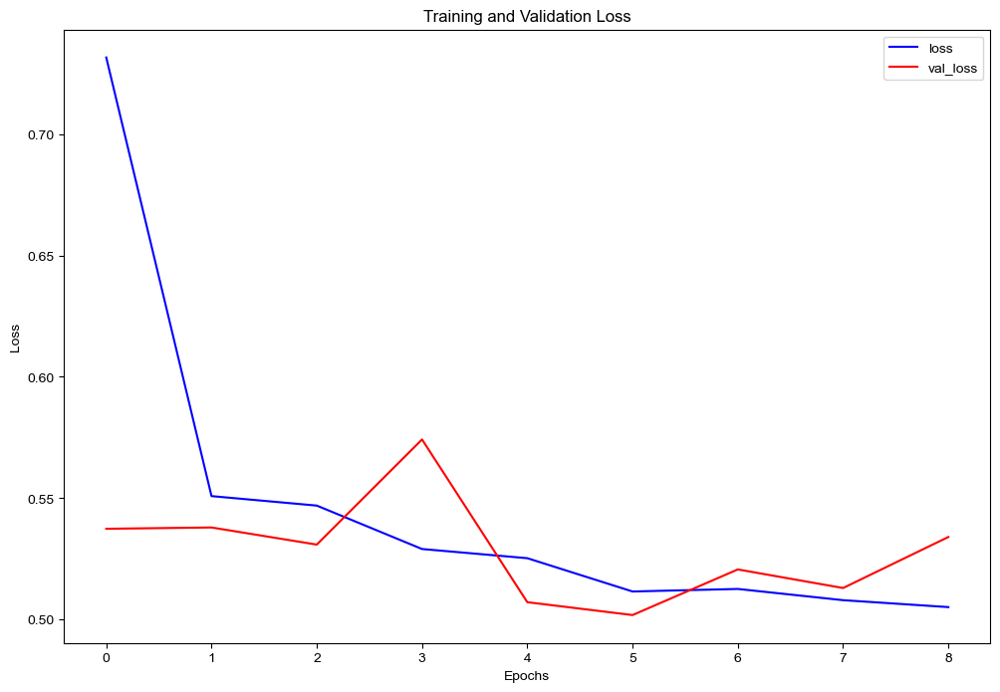

In [33]:
plt.figure(figsize=(12, 8))
sns.lineplot(data=history_df.loc[:, ["loss", "val_loss"]], palette=['b', 'r'], dashes=False)
sns.set_style("whitegrid")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Training and Validation Loss")

Text(0.5, 1.0, 'Training and Validation Accuracy')

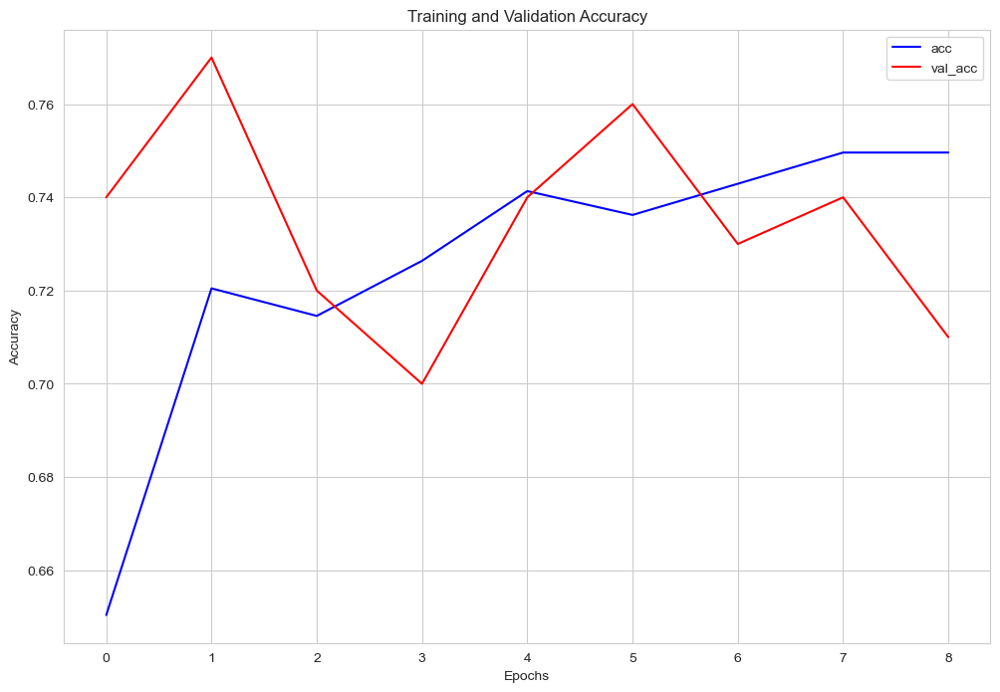

In [34]:
plt.figure(figsize=(12, 8))
sns.lineplot(data=history_df.loc[:, ["acc", "val_acc"]], palette=['b', 'r'], dashes=False)
sns.set_style("whitegrid")
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.title("Training and Validation Accuracy")

In [35]:
def get_features(trained_model, validation_data):
    
    def get_truncated_model(trained_model):
    
        """Takes in the model, Returns truncated model without classification layer"""
        
        model = keras.models.Sequential()
        model.add(base_model)
        model.add(layers.Flatten())
        model.add(layers.Dense(512, activation = 'relu'))
        
        for i, layer in enumerate(model.layers):
            layer.set_weights(trained_model.layers[i].get_weights())
            
        model.compile(optimizer = keras.optimizers.Adam(),
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])
    
        return model

    # Get truncated model
    truncated_model = get_truncated_model(model)
    
    # Use truncated model to predict features from the last hidden layer
    features = truncated_model.predict(validation_data)
        
    return features

In [36]:
features = get_features(model, val_generator)


4/4 ━━━━━━━━━━━━━━━━━━━━ 5s 1s/step


In [37]:
tsne_model = TSNE(random_state=42, perplexity=4).fit_transform(features)


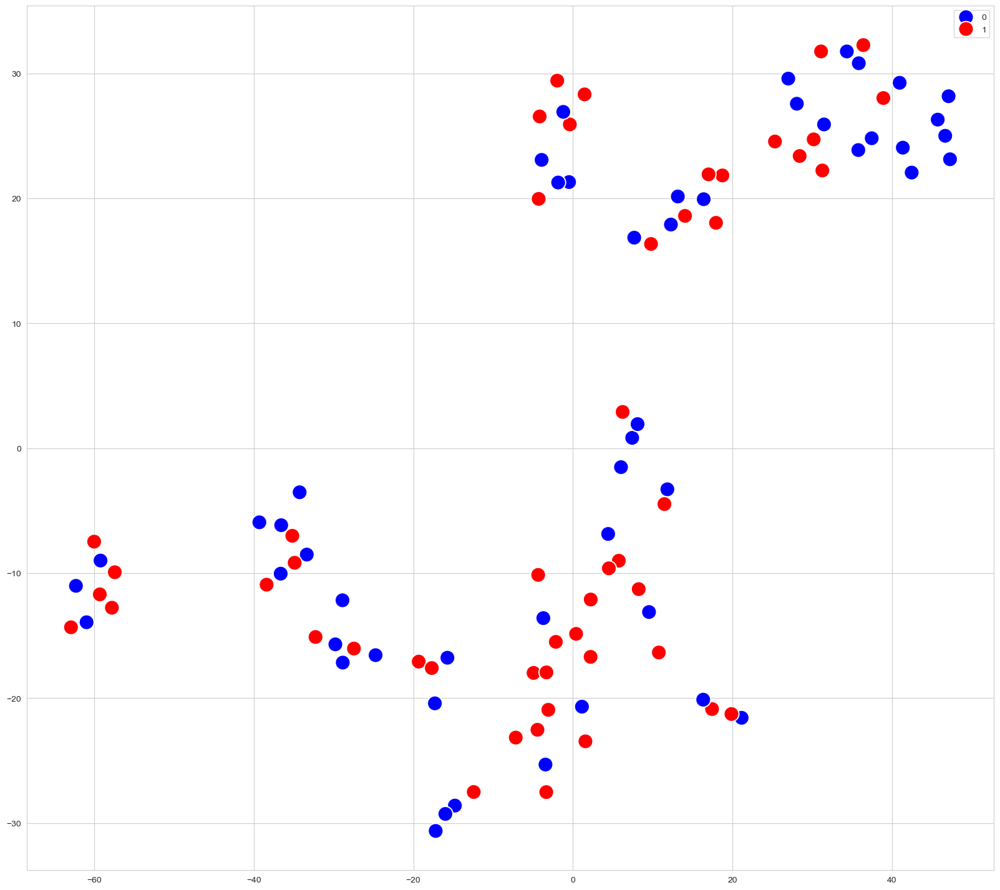

In [38]:
visualise_tsne_datapoints(tsne_model, y_val)


In [39]:
def visualise_model_tsne_3d(tsne_model, val_labels):
    colour_map = [] 
    for i in val_labels: 
        if i == 1: 
            colour_map.append('r') 
        else: 
            colour_map.append('b')

    fig = plt.figure(figsize=(18, 18))
    ax = fig.add_subplot(111, projection='3d')
    ax.scatter(*zip(*tsne_model), c=colour_map, s=50, alpha=1)
    legenditems = [(plt.Rectangle((0,0),1,1, color=c), "Non_Autistic" if str(i) == '0' else "Autistic") for i,c in enumerate(np.unique(colour_map))]
    plt.legend(*zip(*legenditems))
    plt.show()

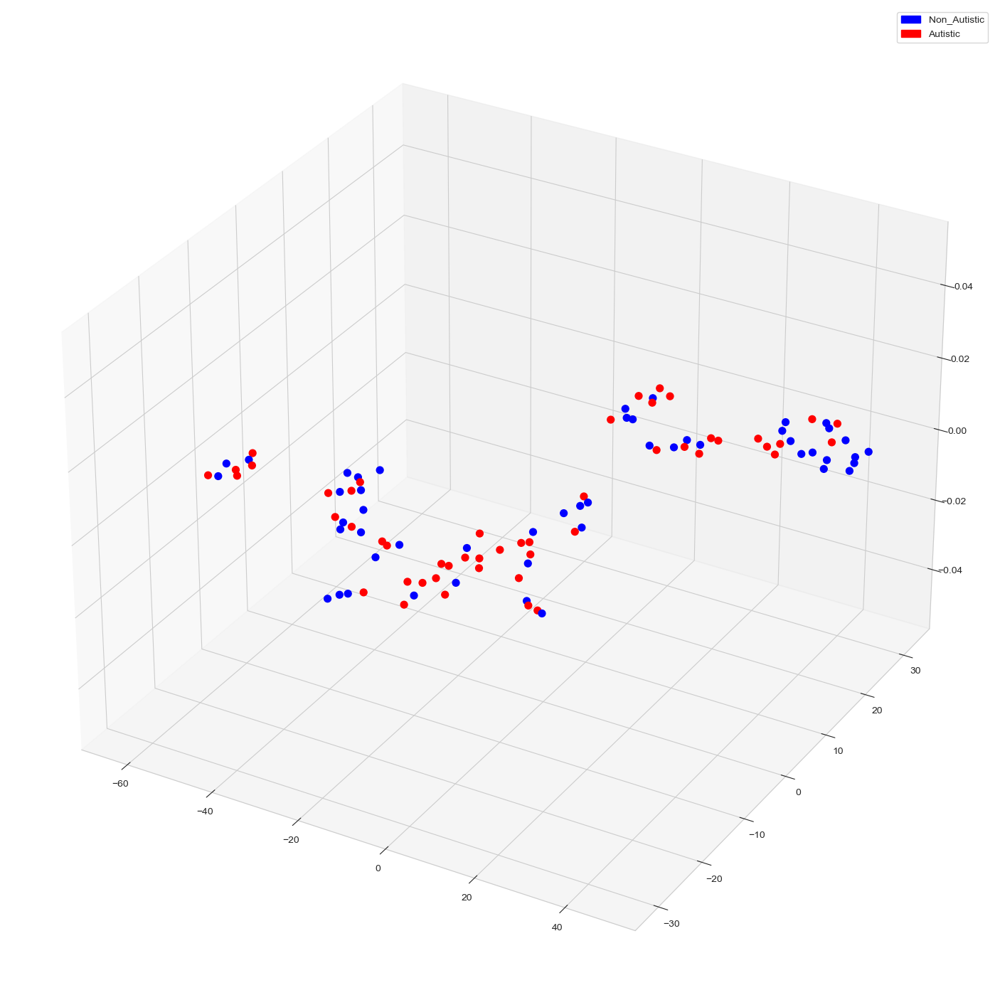

In [40]:
visualise_model_tsne_3d(tsne_model, y_val)


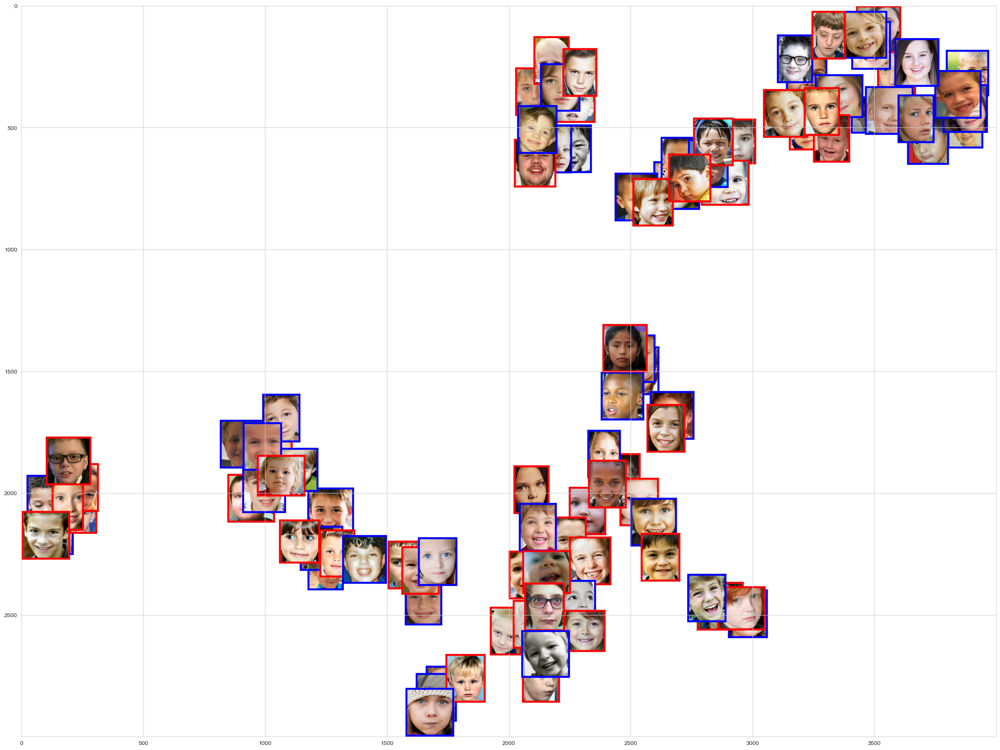

In [41]:
visualise_tsne_images(tsne_model, train_imgs, y_val)


In [42]:
random.shuffle(test_imgs)
X_test, y_test = read_and_process_image(test_imgs)
X = np.array(X_test)

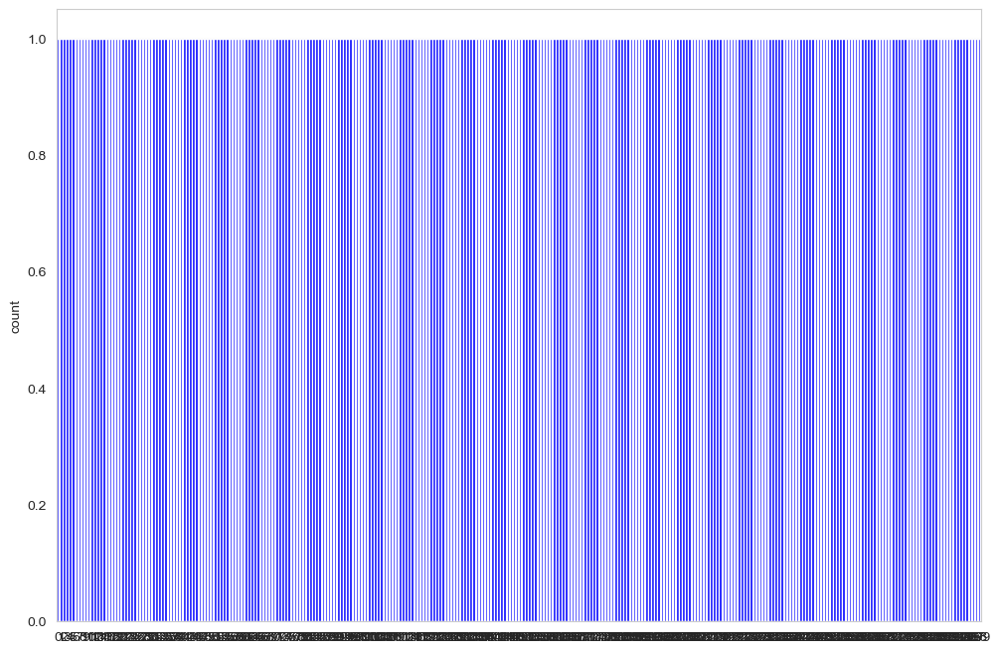

In [43]:
sns.set_palette(sns.color_palette(["b", "r"]))
plt.figure(figsize=(12, 8))
sns.countplot(y_test, saturation=1);

In [44]:
pred = model.predict(X)
threshold = 0.5
predictions = np.where(pred > threshold, 1,0)

10/10 ━━━━━━━━━━━━━━━━━━━━ 13s 1s/step


In [45]:
test = pd.DataFrame(data = predictions, columns = ["predictions"])
test
test["filename"] = [os.path.basename(i) for i in test_imgs]
test["test_labels"] = y_test
test = test[["filename", "test_labels", "predictions"]]
test

,filename,test_labels,predictions
0,Non_Autistic.132.jpg,0,0
1,Non_Autistic.103.jpg,0,0
2,Non_Autistic.119.jpg,0,0
3,Non_Autistic.72.jpg,0,0
4,Non_Autistic.122.jpg,0,0
...,...,...,...
295,Autistic.32.jpg,1,1
296,Autistic.122.jpg,1,1
297,Non_Autistic.52.jpg,0,0
298,Non_Autistic.5.jpg,0,0


In [46]:
test = pd.DataFrame(data = predictions, columns = ["predictions"])
test
test["filename"] = [os.path.basename(i) for i in test_imgs]
test["test_labels"] = y_test
test = test[["filename", "test_labels", "predictions"]]
test

,filename,test_labels,predictions
0,Non_Autistic.132.jpg,0,0
1,Non_Autistic.103.jpg,0,0
2,Non_Autistic.119.jpg,0,0
3,Non_Autistic.72.jpg,0,0
4,Non_Autistic.122.jpg,0,0
...,...,...,...
295,Autistic.32.jpg,1,1
296,Autistic.122.jpg,1,1
297,Non_Autistic.52.jpg,0,0
298,Non_Autistic.5.jpg,0,0


In [47]:
test = pd.DataFrame(data = predictions, columns = ["predictions"])
test
test["filename"] = [os.path.basename(i) for i in test_imgs]
test["test_labels"] = y_test
test = test[["filename", "test_labels", "predictions"]]
test

,filename,test_labels,predictions
0,Non_Autistic.132.jpg,0,0
1,Non_Autistic.103.jpg,0,0
2,Non_Autistic.119.jpg,0,0
3,Non_Autistic.72.jpg,0,0
4,Non_Autistic.122.jpg,0,0
...,...,...,...
295,Autistic.32.jpg,1,1
296,Autistic.122.jpg,1,1
297,Non_Autistic.52.jpg,0,0
298,Non_Autistic.5.jpg,0,0


In [48]:
model_accuracy = accuracy_score(y_test, predictions)
print("Model Accuracy: {:.2f}%".format(model_accuracy * 100))

Model Accuracy: 73.67%


In [49]:
cl_report = classification_report(y_test, predictions)
print(cl_report)

              precision    recall  f1-score   support

           0       0.70      0.82      0.76       150
           1       0.78      0.65      0.71       150

    accuracy                           0.74       300
   macro avg       0.74      0.74      0.73       300
weighted avg       0.74      0.74      0.73       300



In [50]:
cn_matrix= confusion_matrix(y_test, predictions)
cn_matrix

array([[123,  27],
       [ 52,  98]], dtype=int64)

Text(0.5, 1.0, 'Confusion Matrix')

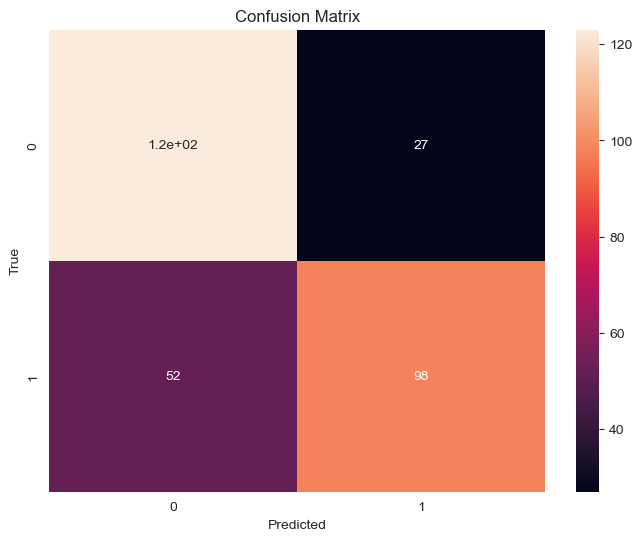

In [51]:
f, ax = plt.subplots(figsize = (8,6))
ax = sns.heatmap(cn_matrix, annot=True)
ax.set_xlabel("Predicted")
ax.set_ylabel("True")
ax.set_title("Confusion Matrix")

In [52]:
fpr, tpr, _ = roc_curve(y_test, predictions)
roc_auc= auc(fpr, tpr)

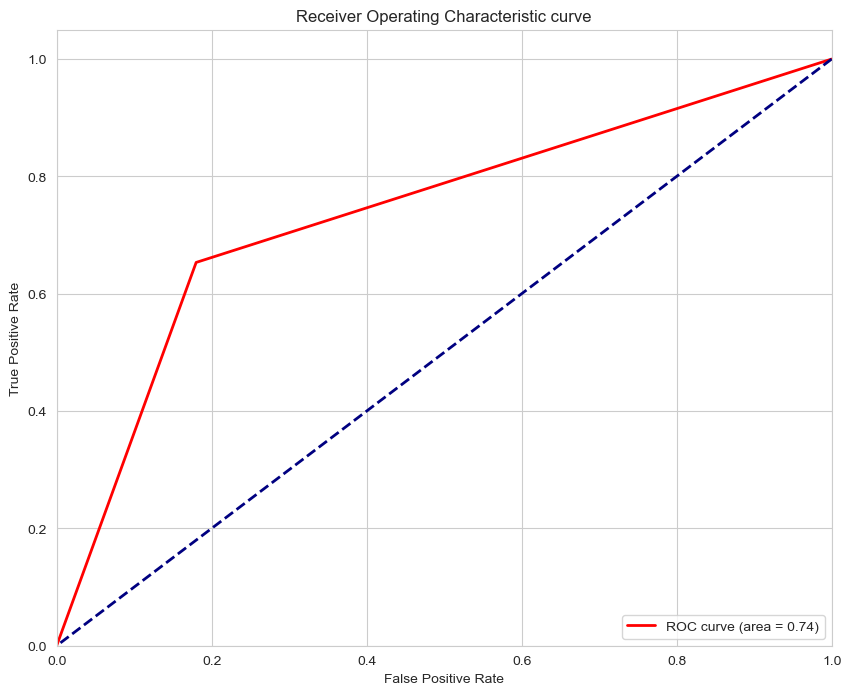

In [53]:
plt.figure(figsize = (10,8))
plt.plot(fpr, tpr, color = 'red', lw = 2, label = 'ROC curve (area = %0.2f)' % roc_auc)
plt.plot([1,0], [1,0], color = 'navy', lw = 2, linestyle = '--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title("Receiver Operating Characteristic curve")
plt.legend(loc = 'lower right')

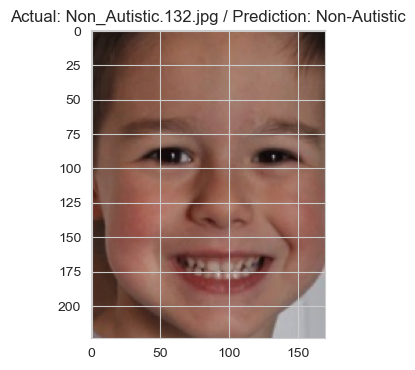

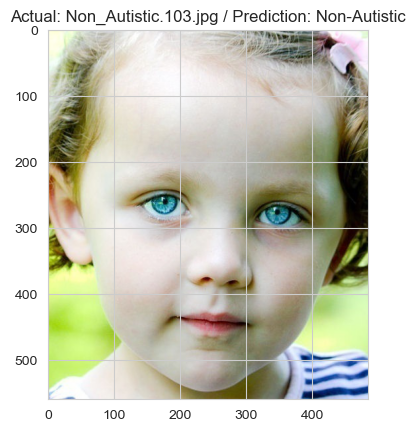

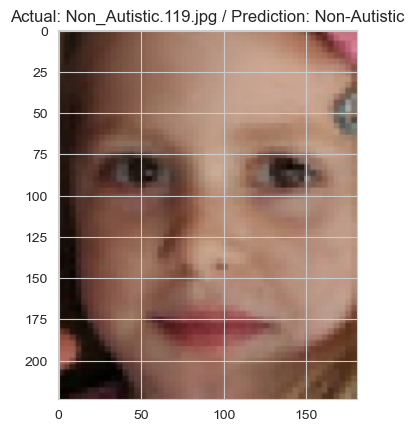

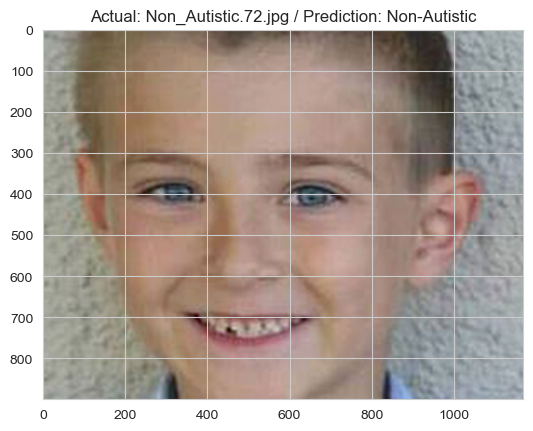

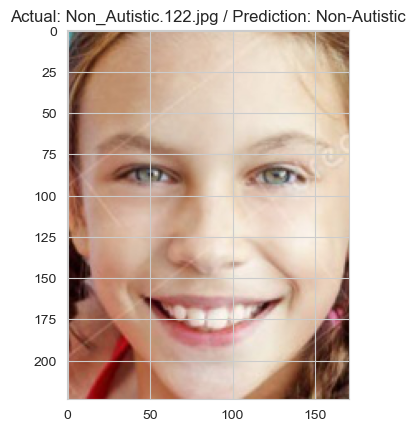

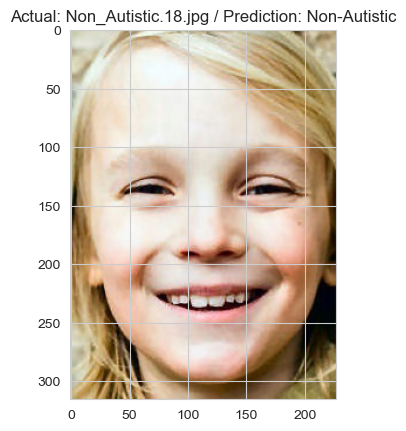

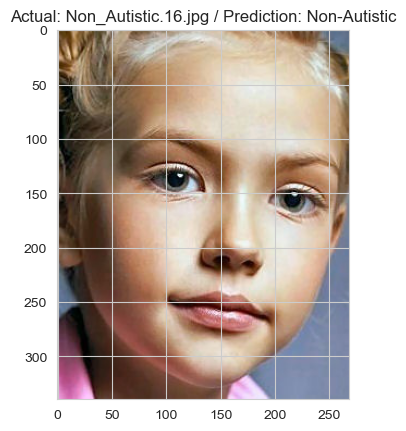

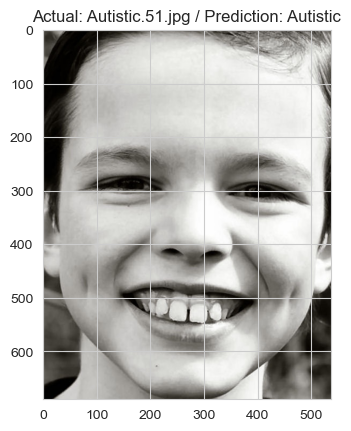

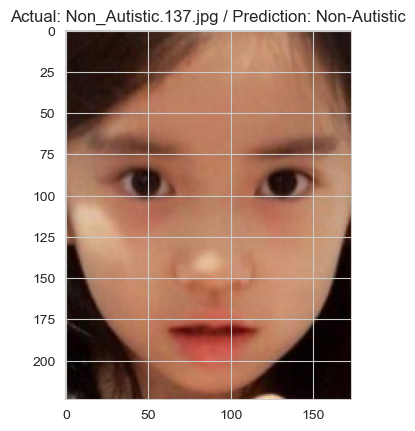

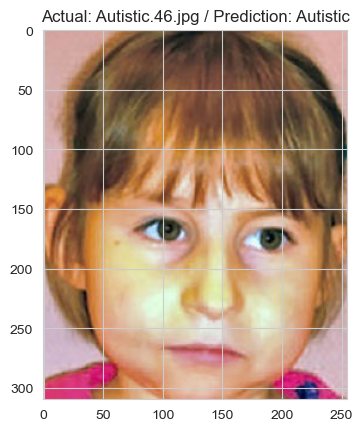

In [54]:
plt.figure(figsize=(4,4))
for val, i in enumerate(test_imgs[:10]):
    img = mpimg.imread(i)
    imgplot = plt.imshow(img)
    plt.title('Actual: ' + os.path.basename(i) + ' / Prediction: ' +  f"{'Autistic' if predictions[val] == 1 else 'Non-Autistic'}")
    plt.show()